The following example shows how to train a model. Get a list of training data csv file in the selected folder. Lessons learned so far:
- Training result is very sensitive to normalization. The normalization approach based on mean and variance does not work very well. Still need to manually set mean and variance.
- t-sne plot of adapter trace is an important flag of training result. 
- h net does not have to descent because phi net training strives to make it rise, while h net training itself tries to lower the loss
- Increase the h training frequency to fight against rising h 
- Increase alpha to push domain info to adapter
- Increase number of features to minimize MSE loss.
- ocassional small spike in cross entropy loss is possibly a sign that phi net become further domain invariant and may not be bad.
- at the late stage of training while both mse loss and cross entropy loss converge. May need to train h net every step to refine the optimization direction.
- Do not need to select the model at the end epoch. Select the epoch when the loss is reasonably low and stable. 

Existing problem:
- The more classes, the harder to train. The difficulty comes from instability of loss_f and loss_c. alpha is hard to tune.
- t-sne gets worse as epoch grows and the cross entropy loss remains the same. 

In [1]:
import os
import matplotlib.pyplot as plt

import training_manager

current_dir = os.getcwd()
# subfolder = "wind_near_wall_bemt_in_control_train_x_only_wind"
# subfolder = "wind_near_wall_bemt_in_control_train_z_only_wind"
subfolder = "wind_near_wall_bemt_in_control_train_xz_wind"
# subfolder = "nf_training_back2back"
folder_path = os.path.join(os.path.dirname(current_dir), "data", "training", subfolder)
file_names = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

# Filter out files that do not end with .csv
file_names = [f for f in file_names if f.endswith('.csv')]
# add subfolder to the file names
data_list = [os.path.join(subfolder, f) for f in file_names]
for data in data_list:
    print(data)

path1 = os.path.join(subfolder, "input_label_map_disturbance_force_label.yaml")
path2 = os.path.join(subfolder, "column_map.yaml")

wind_near_wall_bemt_in_control_train_xz_wind\test_wind_near_wall_x0_0_y0_0_z0_0_d0_5_train_bemt.csv
wind_near_wall_bemt_in_control_train_xz_wind\test_wind_near_wall_x0_0_y0_0_z3_0_d0_5_train_bemt.csv
wind_near_wall_bemt_in_control_train_xz_wind\test_wind_near_wall_x0_0_y0_0_z5_0_d0_5_train_bemt.csv
wind_near_wall_bemt_in_control_train_xz_wind\test_wind_near_wall_x0_0_y0_0_zn3_0_d0_5_train_bemt.csv
wind_near_wall_bemt_in_control_train_xz_wind\test_wind_near_wall_x0_0_y0_0_zn5_0_d0_5_train_bemt.csv
wind_near_wall_bemt_in_control_train_xz_wind\test_wind_near_wall_xn1_0_y0_0_z0_0_d0_5_train_bemt.csv
wind_near_wall_bemt_in_control_train_xz_wind\test_wind_near_wall_xn1_0_y0_0_z3_0_d0_5_train_bemt.csv
wind_near_wall_bemt_in_control_train_xz_wind\test_wind_near_wall_xn1_0_y0_0_z5_0_d0_5_train_bemt.csv
wind_near_wall_bemt_in_control_train_xz_wind\test_wind_near_wall_xn1_0_y0_0_zn3_0_d0_5_train_bemt.csv
wind_near_wall_bemt_in_control_train_xz_wind\test_wind_near_wall_xn1_0_y0_0_zn5_0_d0_5_train_

- Make sure the input_label_map_disturbance_force_label.yaml is in the selected folder. This yaml defines which fields are model inputs and which fields are data labels. 
- Make sure the column_map.yaml is in the selected folder. This yaml maps data fields to the corresponding column in the csv files. This file can be auto-generated by `Simulation\simulation\training_data_user_guide.ipynb`
- If this is the first time to train on this data. The script will normalize the data and save the normalization parameters into a file.

Loading normalization params file from
..\data\training\wind_near_wall_bemt_in_control_train_xz_wind\normalization_params.yaml


c:\YimingVirtualDDrive\7_workSpace\repo\neural-fly\Simulation\learning\data_factory.py:243: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(rows, cols, figsize=figsize)


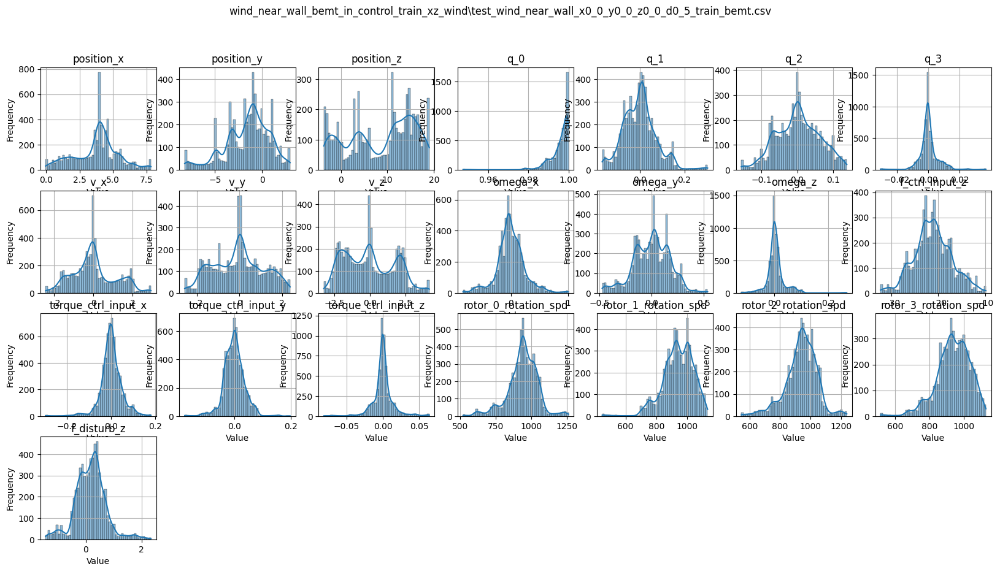

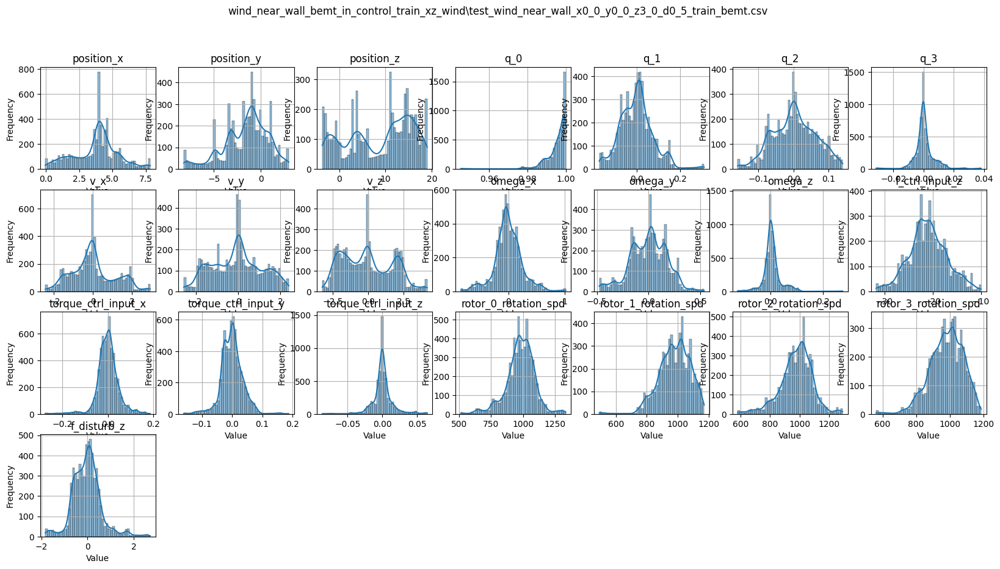

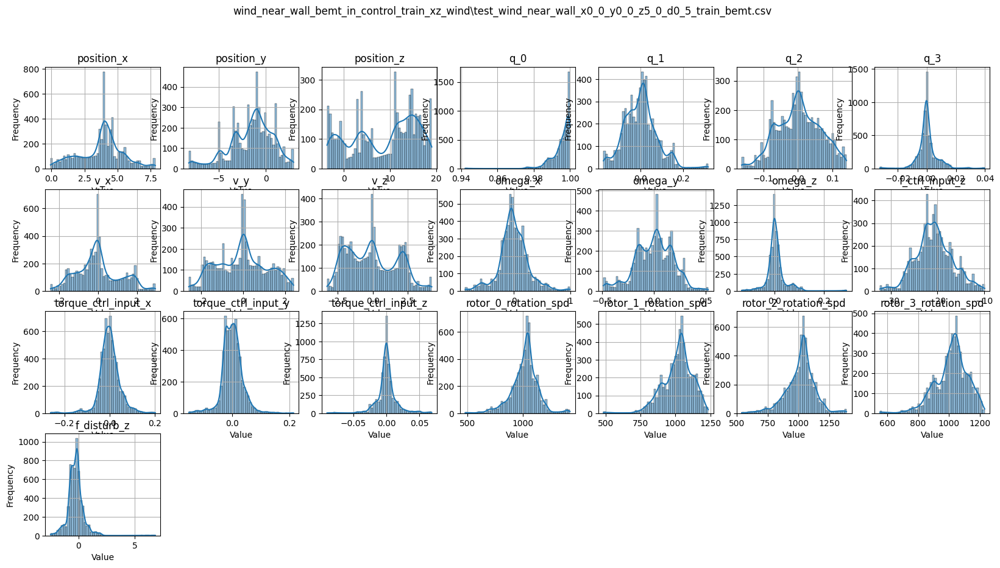

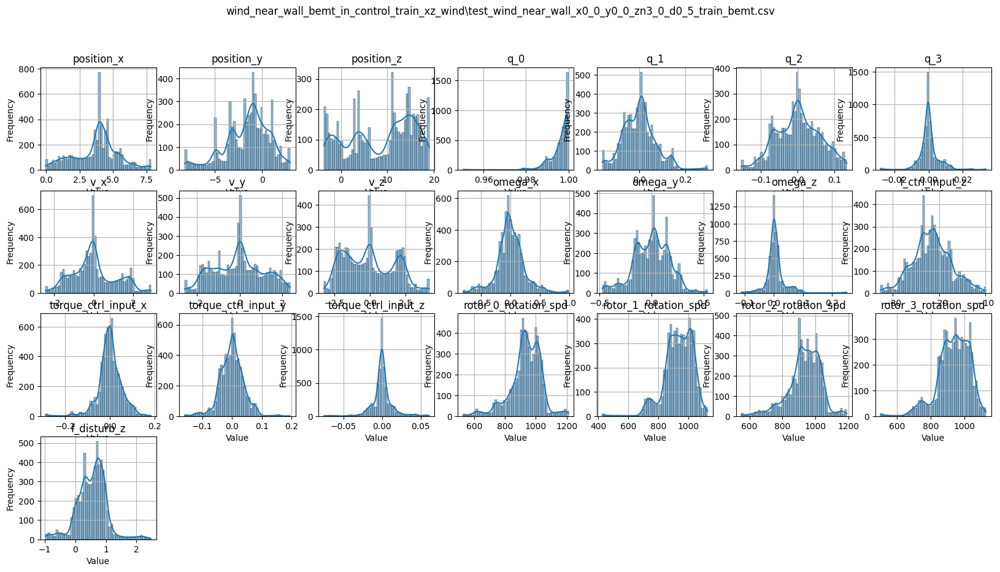

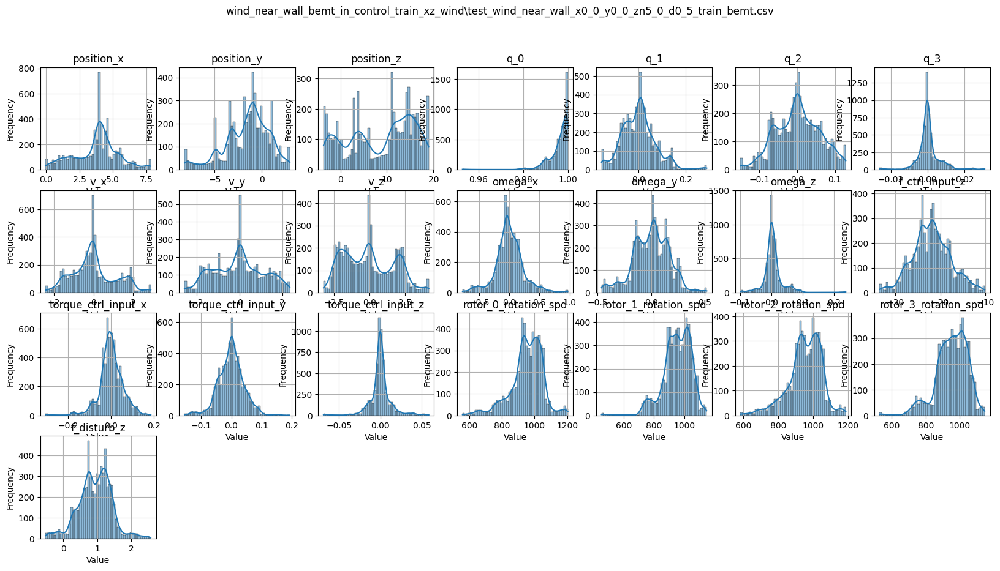

...

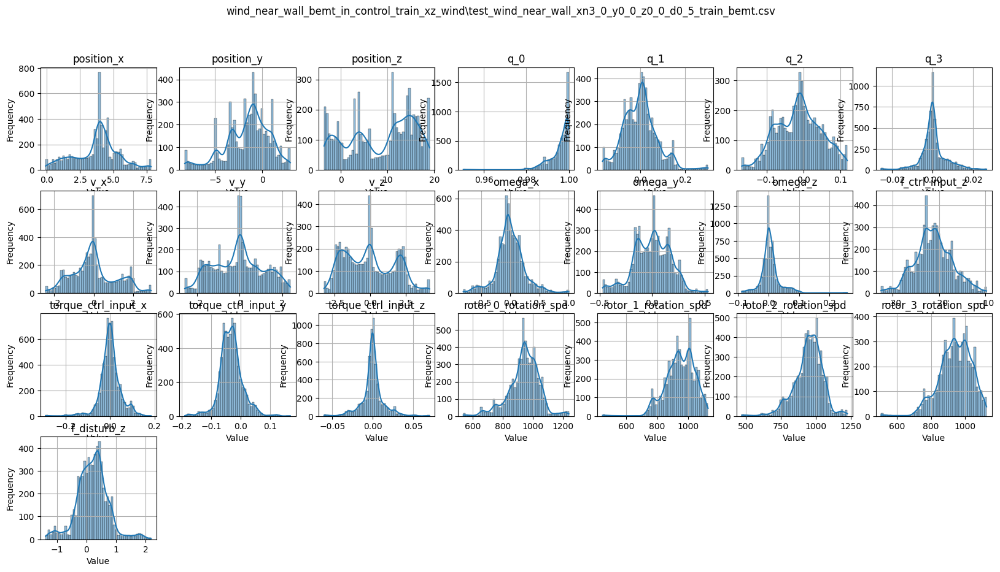

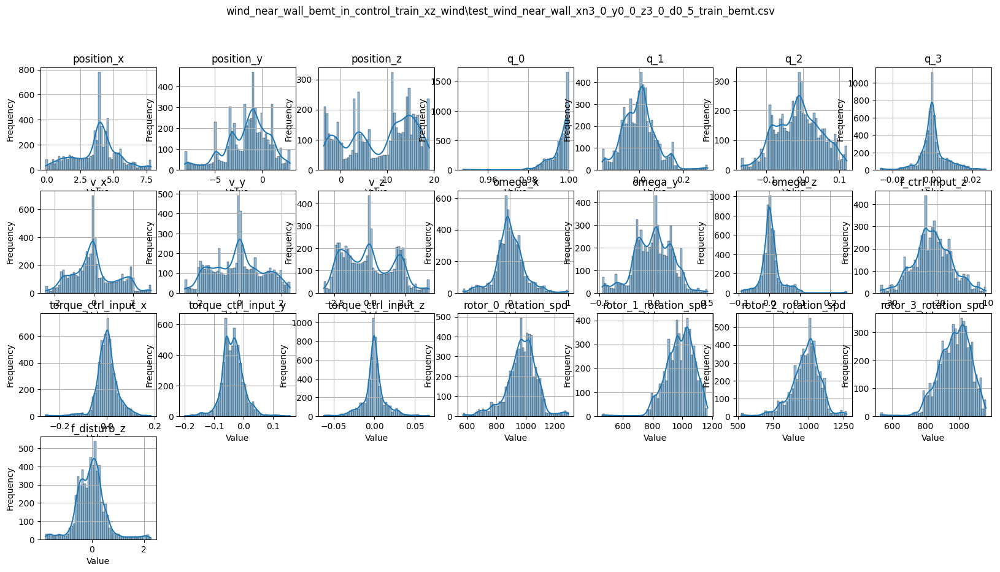

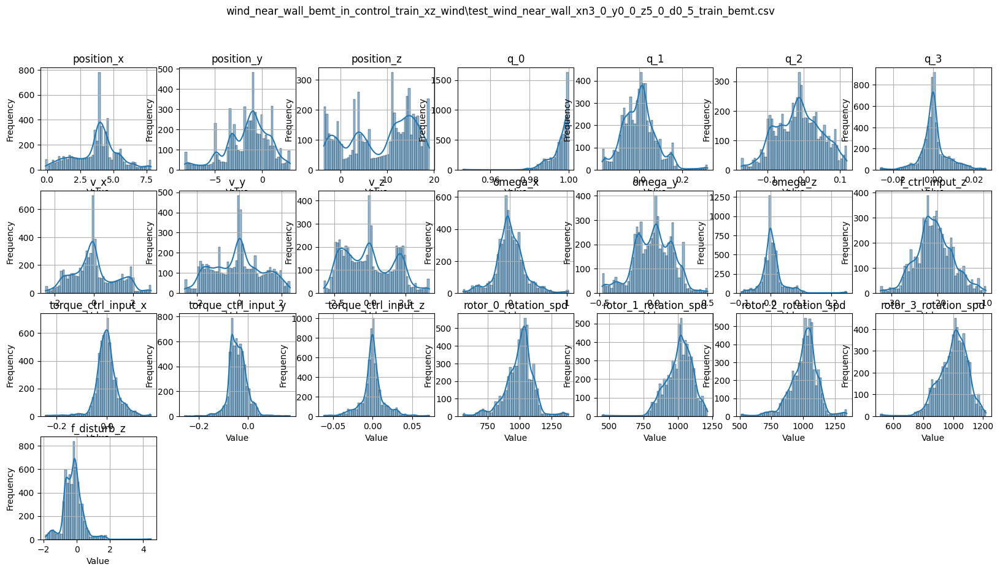

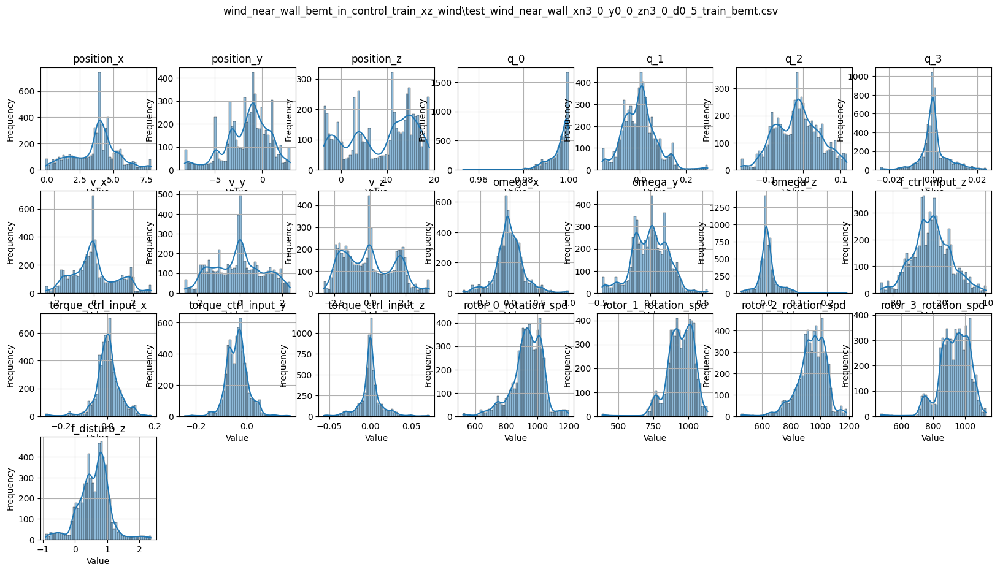

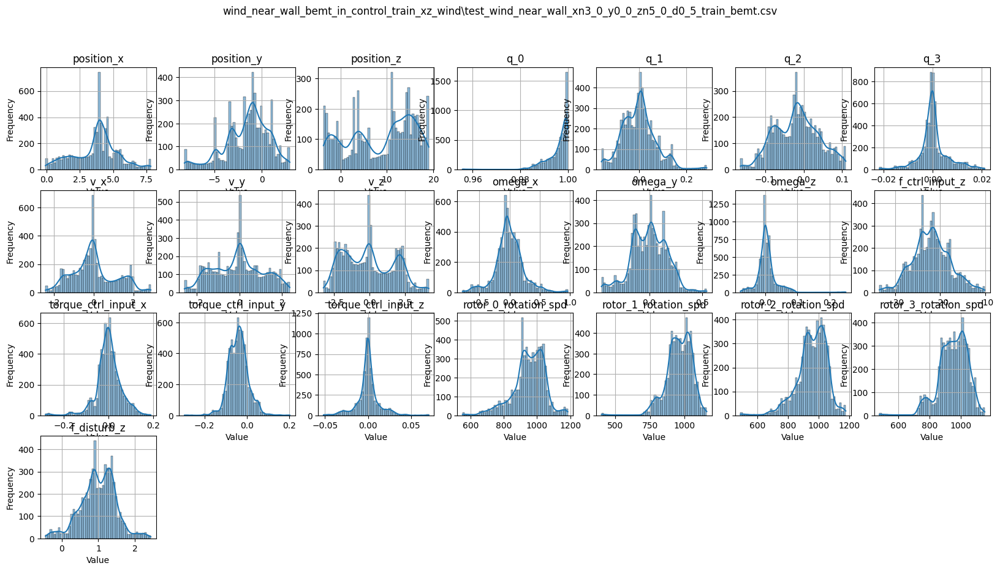

[1] loss_f: 0.69 loss_c: 2.73
[101] loss_f: -0.02 loss_c: 2.72


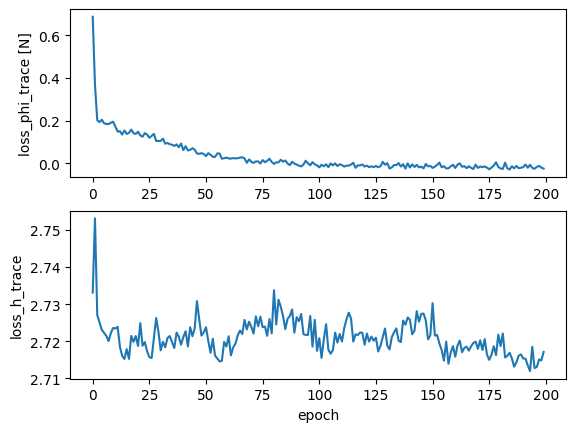

In [2]:
# use the data from previous section to train the model

manager = training_manager.TrainingManager()
manager.set_up(
    data_menu=data_list,
    # data_menu=data_list[:4],    # use small data list for quick testing
    input_label_map_file=path1,
    column_map_file=path2,
    can_skip_io_normalizaiton=False
)
plt.show() 
manager.train()
manager.trainer_instance.plot_loss()

plt.show()  

Inspect data in the data list.

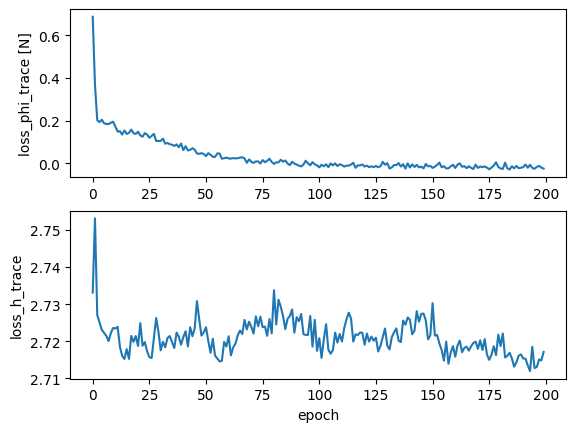

In [3]:
# trainer_instance.inspect_data(data_list[:2])
manager.trainer_instance.plot_loss()

Inspect t-sne of a_trace.

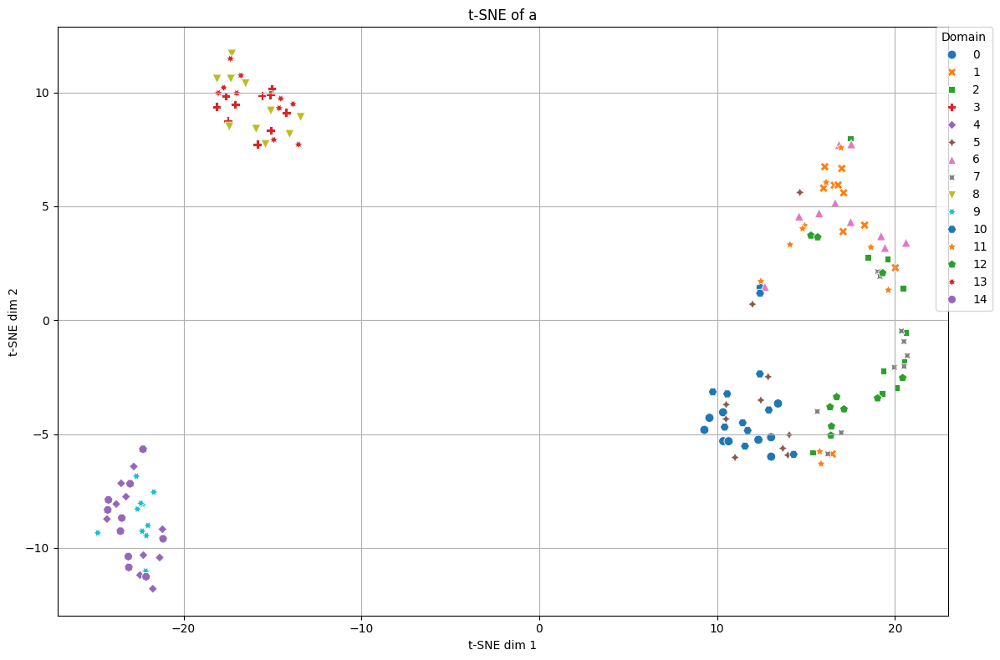

In [4]:
import performance_analyzer
can_print_3d = False
n = 100
performance_analyzer.plot_tsne_of_a(manager.trainer_instance.a_trace, list(range(n, n + 10)))
plt.show()  
if can_print_3d:
    %matplotlib tk
    performance_analyzer.plot_tsne_3d_of_a(manager.trainer_instance.a_trace, list(range(n, n + 10)))


After training, we can save the model in the following way.

In [5]:
model_name = subfolder
manager.save_model(model_name)

Model saved to model\wind_near_wall_bemt_in_control_train_xz_wind.pth


Validate the model using the validation set. 

wind_near_wall_validation_bemt\test_wind_near_wall_x0_0_y0_0_zn10_0_d0_5_validation_with_bemt.csv
wind_near_wall_validation_bemt\test_wind_near_wall_x0_0_y0_0_zn1_0_d0_5_validation_with_bemt.csv
wind_near_wall_validation_bemt\test_wind_near_wall_x0_0_y0_0_zn4_0_d0_5_validation_with_bemt.csv
wind_near_wall_validation_bemt\test_wind_near_wall_xn2_0_y0_0_zn10_0_d0_5_validation_with_bemt.csv
wind_near_wall_validation_bemt\test_wind_near_wall_xn2_0_y0_0_zn1_0_d0_5_validation_with_bemt.csv
wind_near_wall_validation_bemt\test_wind_near_wall_xn2_0_y0_0_zn4_0_d0_5_validation_with_bemt.csv
wind_near_wall_validation_bemt\test_wind_near_wall_xn5_0_y0_0_zn10_0_d0_5_validation_with_bemt.csv
wind_near_wall_validation_bemt\test_wind_near_wall_xn5_0_y0_0_zn1_0_d0_5_validation_with_bemt.csv
wind_near_wall_validation_bemt\test_wind_near_wall_xn5_0_y0_0_zn4_0_d0_5_validation_with_bemt.csv
phi net input output fields:
input ['position_x', 'position_y', 'position_z', 'q_0', 'q_1', 'q_2', 'q_3', 'v_x', 'v_y'

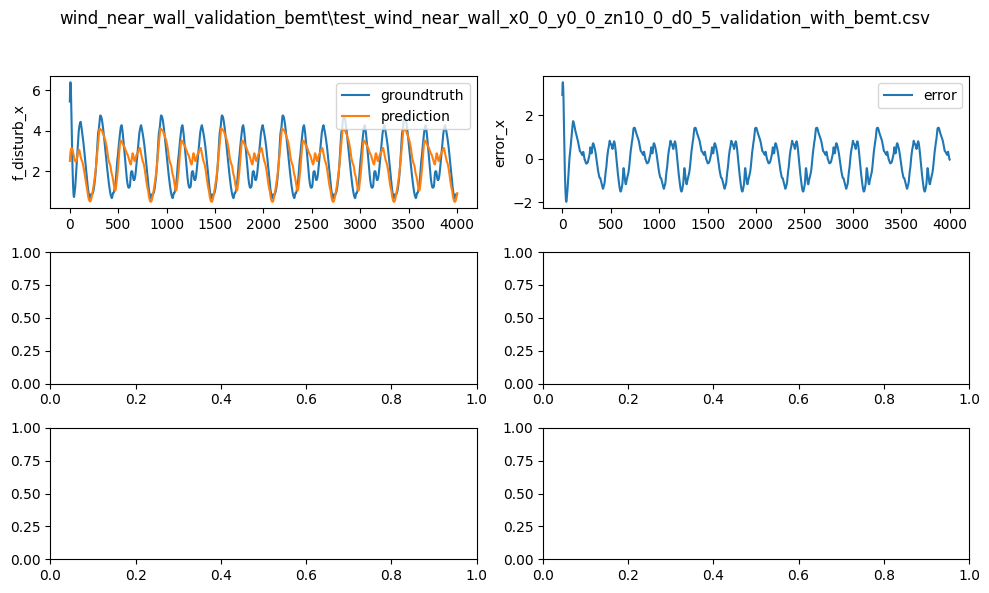

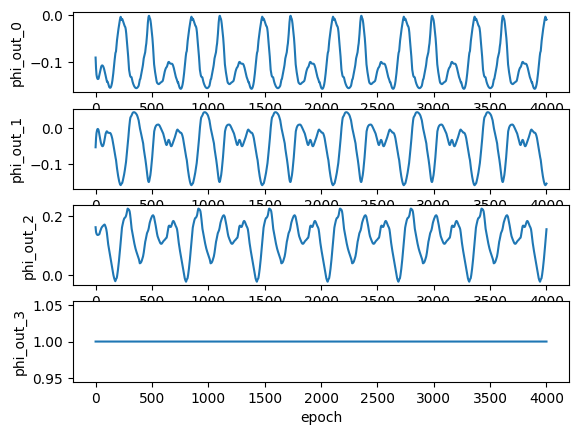

phi_out: tensor([[-0.0898, -0.0539,  0.1607,  1.0000],
        [-0.0904, -0.0533,  0.1605,  1.0000],
        [-0.0909, -0.0525,  0.1604,  1.0000],
        ...,
        [-0.0073, -0.1629,  0.1676,  1.0000],
        [-0.0082, -0.1616,  0.1698,  1.0000],
        [-0.0091, -0.1603,  0.1720,  1.0000]])
a = tensor([[16.9848],
        [26.4256],
        [10.6597],
        [ 1.7469]])
RMS: [0.99990003]
P90: [1.5720515]


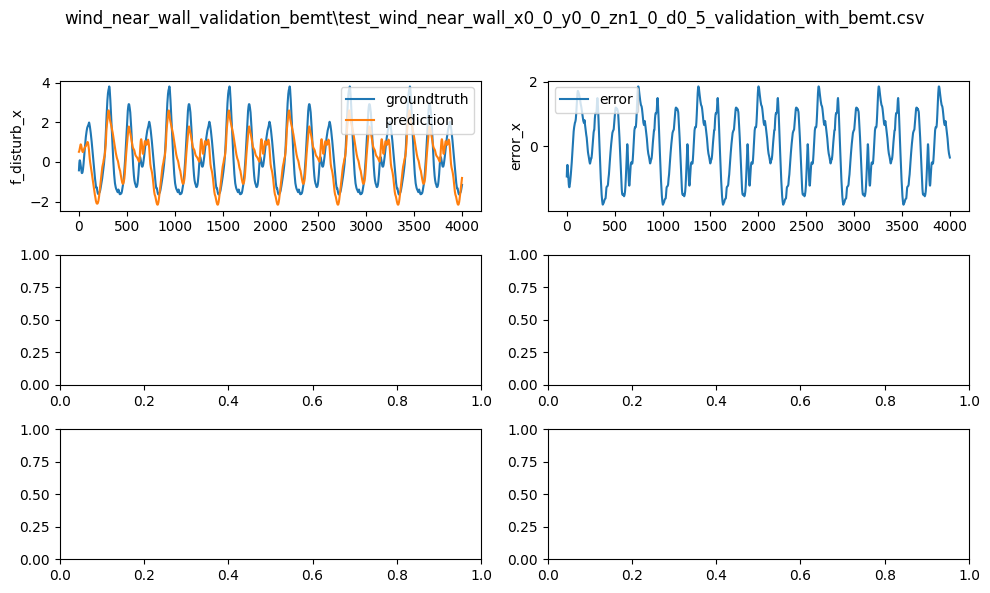

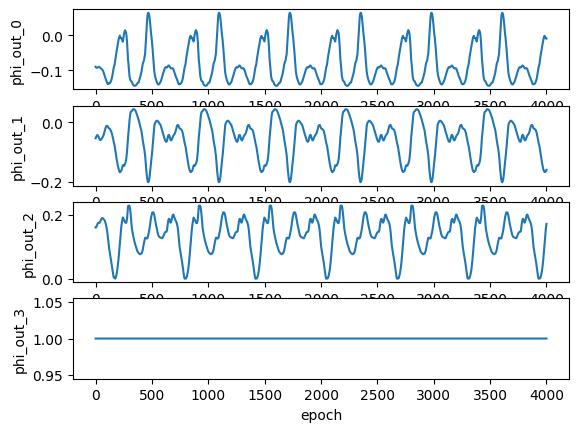

phi_out: tensor([[-0.0898, -0.0538,  0.1609,  1.0000],
        [-0.0911, -0.0524,  0.1601,  1.0000],
        [-0.0923, -0.0509,  0.1596,  1.0000],
        ...,
        [-0.0077, -0.1609,  0.1649,  1.0000],
        [-0.0078, -0.1603,  0.1676,  1.0000],
        [-0.0086, -0.1591,  0.1697,  1.0000]])
a = tensor([[15.8093],
        [26.8832],
        [ 7.1936],
        [ 2.6030]])
RMS: [0.89041637]
P90: [1.4636195]


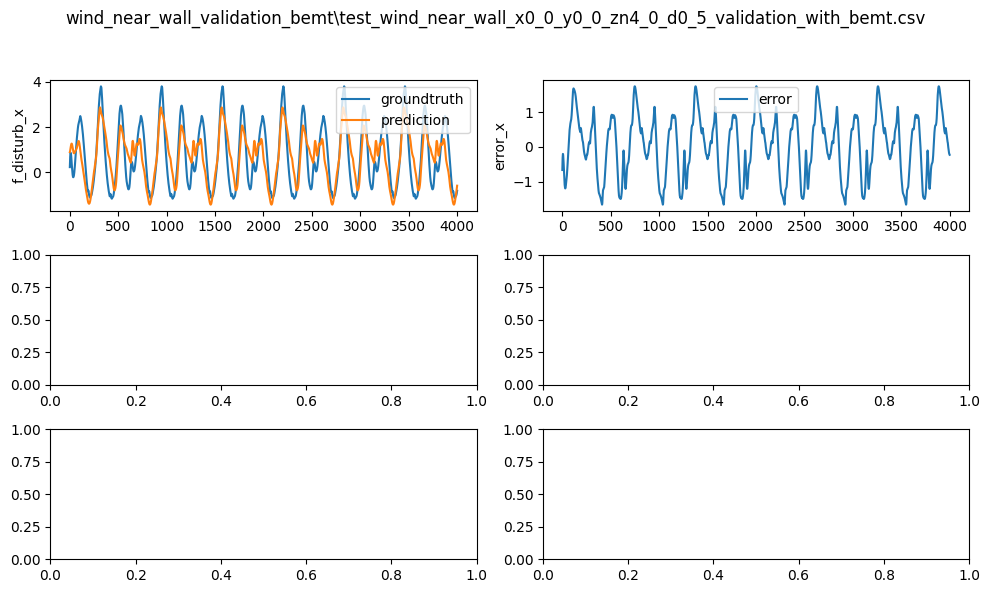

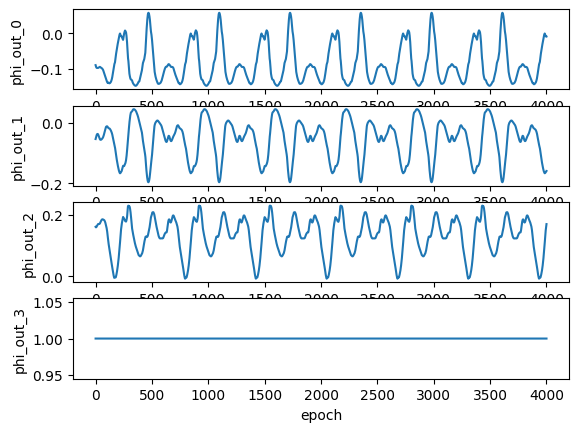

phi_out: tensor([[-0.0901, -0.0531,  0.1622,  1.0000],
        [-0.0968, -0.0448,  0.1587,  1.0000],
        [-0.1023, -0.0376,  0.1552,  1.0000],
        ...,
        [-0.0101, -0.1521,  0.1459,  1.0000],
        [-0.0109, -0.1516,  0.1502,  1.0000],
        [-0.0116, -0.1511,  0.1542,  1.0000]])
a = tensor([[ 5.0814],
        [19.8326],
        [ 5.2464],
        [ 3.1707]])
RMS: [0.78543549]
P90: [1.26350438]


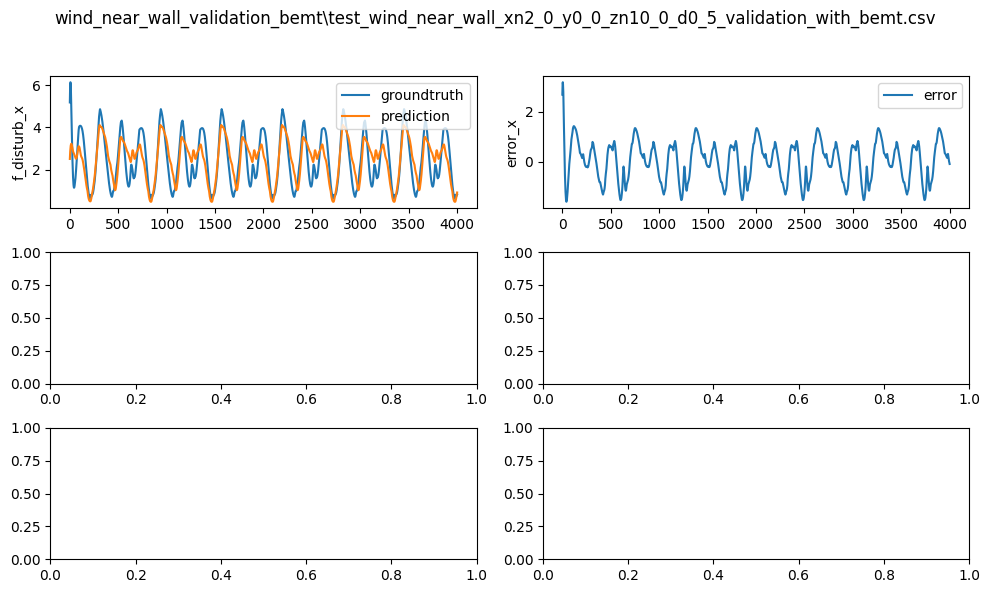

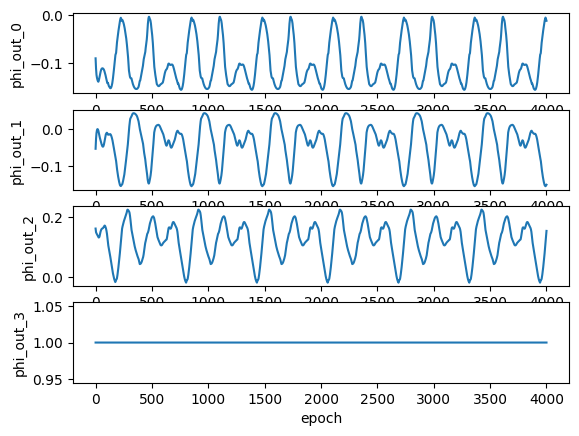

phi_out: tensor([[-0.0897, -0.0539,  0.1608,  1.0000],
        [-0.0904, -0.0527,  0.1611,  1.0000],
        [-0.0909, -0.0514,  0.1615,  1.0000],
        ...,
        [-0.0075, -0.1621,  0.1670,  1.0000],
        [-0.0082, -0.1609,  0.1692,  1.0000],
        [-0.0091, -0.1596,  0.1713,  1.0000]])
a = tensor([[15.4815],
        [25.1131],
        [10.7331],
        [ 1.5342]])
RMS: [1.01265572]
P90: [1.6123827]


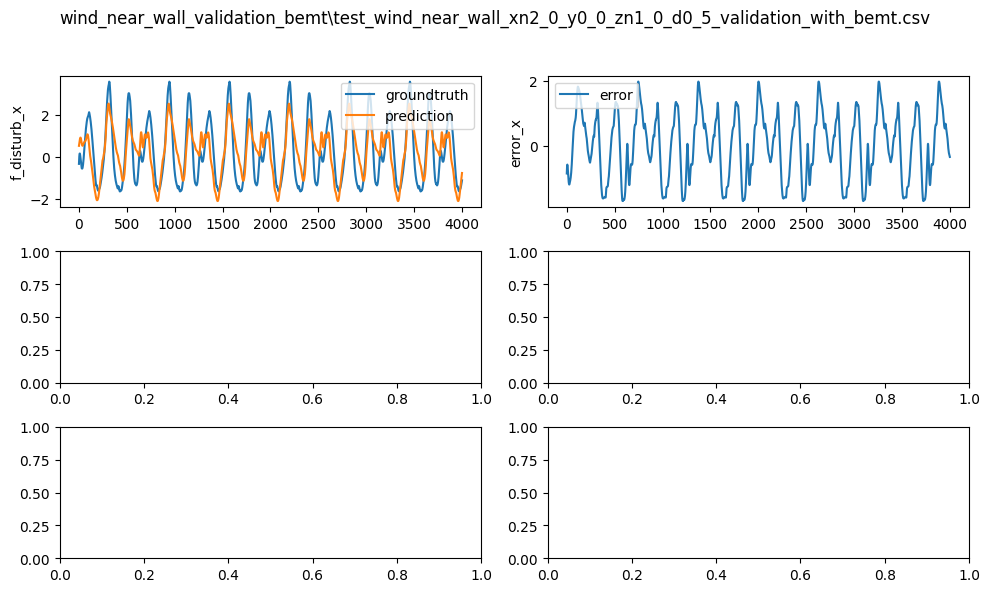

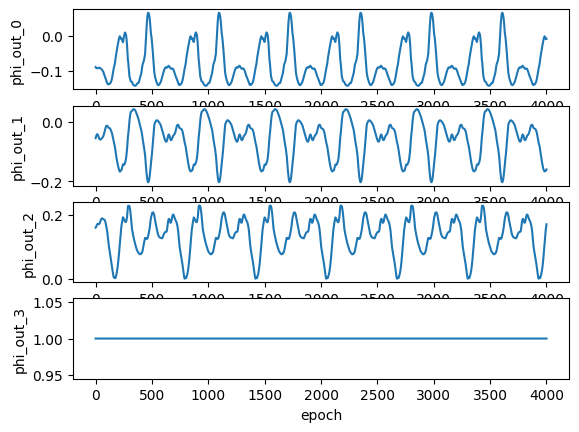

phi_out: tensor([[-0.0898, -0.0539,  0.1609,  1.0000],
        [-0.0910, -0.0518,  0.1610,  1.0000],
        [-0.0921, -0.0497,  0.1613,  1.0000],
        ...,
        [-0.0081, -0.1598,  0.1638,  1.0000],
        [-0.0081, -0.1594,  0.1667,  1.0000],
        [-0.0087, -0.1583,  0.1689,  1.0000]])
a = tensor([[14.7730],
        [25.9985],
        [ 7.5197],
        [ 2.4136]])
RMS: [0.88127468]
P90: [1.47361467]


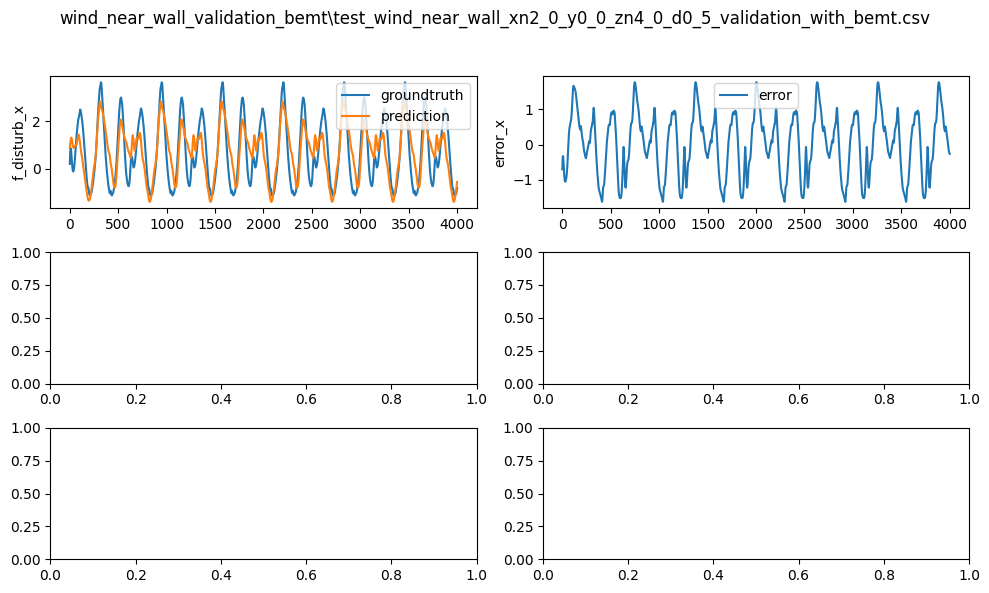

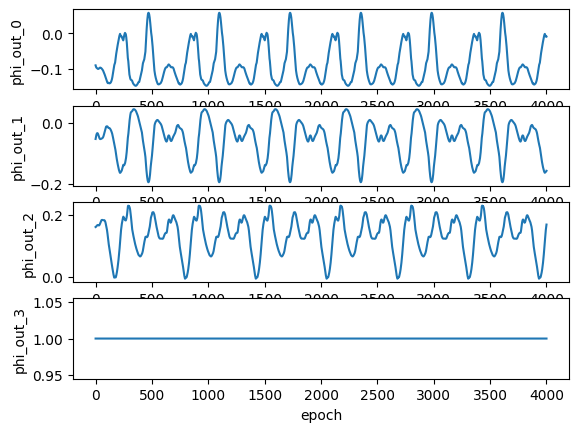

phi_out: tensor([[-0.0900, -0.0531,  0.1623,  1.0000],
        [-0.0965, -0.0435,  0.1606,  1.0000],
        [-0.1013, -0.0354,  0.1581,  1.0000],
        ...,
        [-0.0117, -0.1491,  0.1431,  1.0000],
        [-0.0125, -0.1487,  0.1472,  1.0000],
        [-0.0133, -0.1481,  0.1514,  1.0000]])
a = tensor([[ 1.9161],
        [17.5509],
        [ 6.3843],
        [ 2.6543]])
RMS: [0.76159575]
P90: [1.24381008]


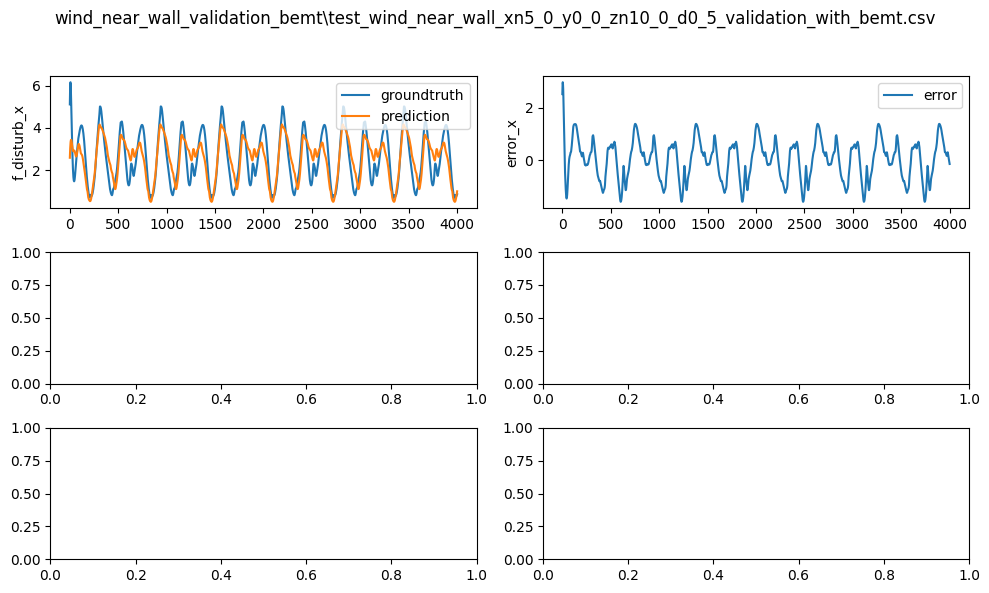

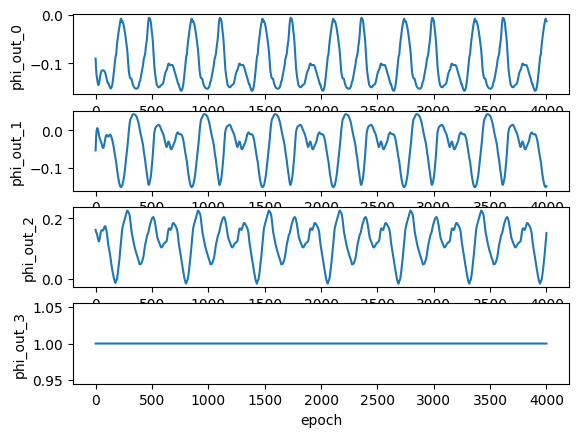

phi_out: tensor([[-0.0897, -0.0539,  0.1609,  1.0000],
        [-0.0908, -0.0513,  0.1618,  1.0000],
        [-0.0918, -0.0488,  0.1627,  1.0000],
        ...,
        [-0.0084, -0.1594,  0.1647,  1.0000],
        [-0.0083, -0.1589,  0.1674,  1.0000],
        [-0.0090, -0.1578,  0.1695,  1.0000]])
a = tensor([[12.4167],
        [22.2629],
        [10.1800],
        [ 1.2223]])
RMS: [1.03453201]
P90: [1.64642209]


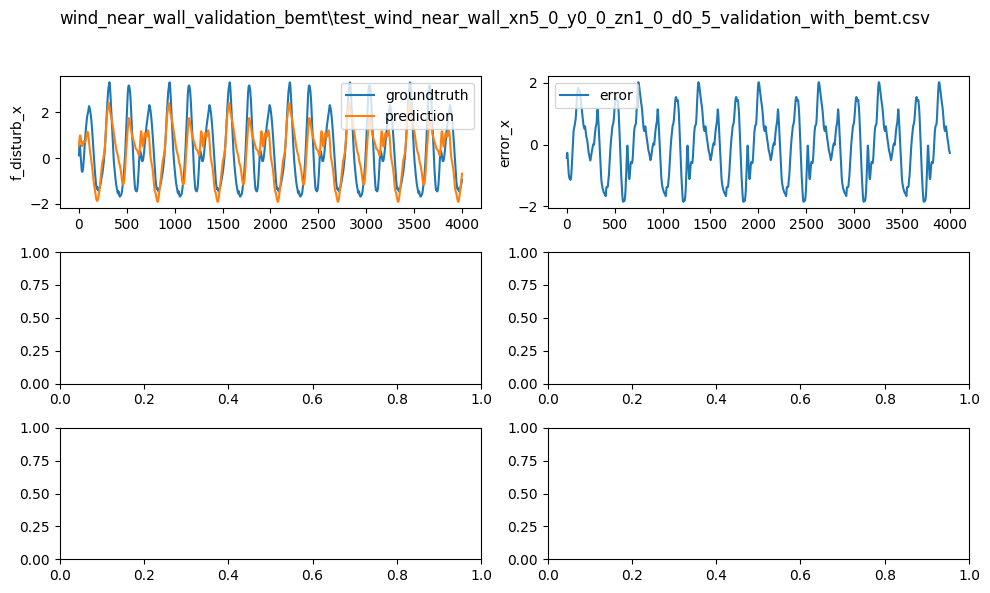

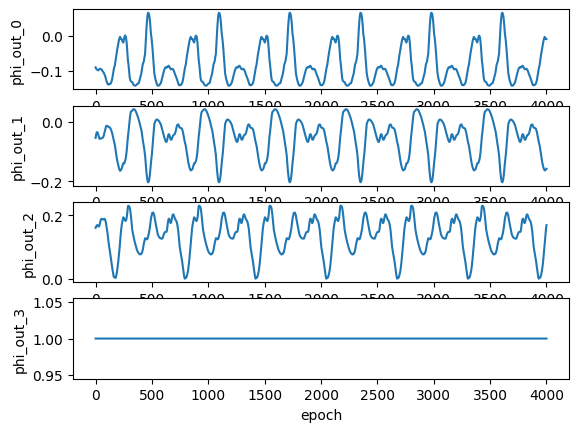

phi_out: tensor([[-0.0897, -0.0539,  0.1610,  1.0000],
        [-0.0908, -0.0506,  0.1624,  1.0000],
        [-0.0919, -0.0475,  0.1639,  1.0000],
        ...,
        [-0.0088, -0.1578,  0.1614,  1.0000],
        [-0.0087, -0.1573,  0.1642,  1.0000],
        [-0.0087, -0.1568,  0.1670,  1.0000]])
a = tensor([[12.2307],
        [23.5970],
        [ 7.9141],
        [ 2.0470]])
RMS: [0.89421363]
P90: [1.51015325]


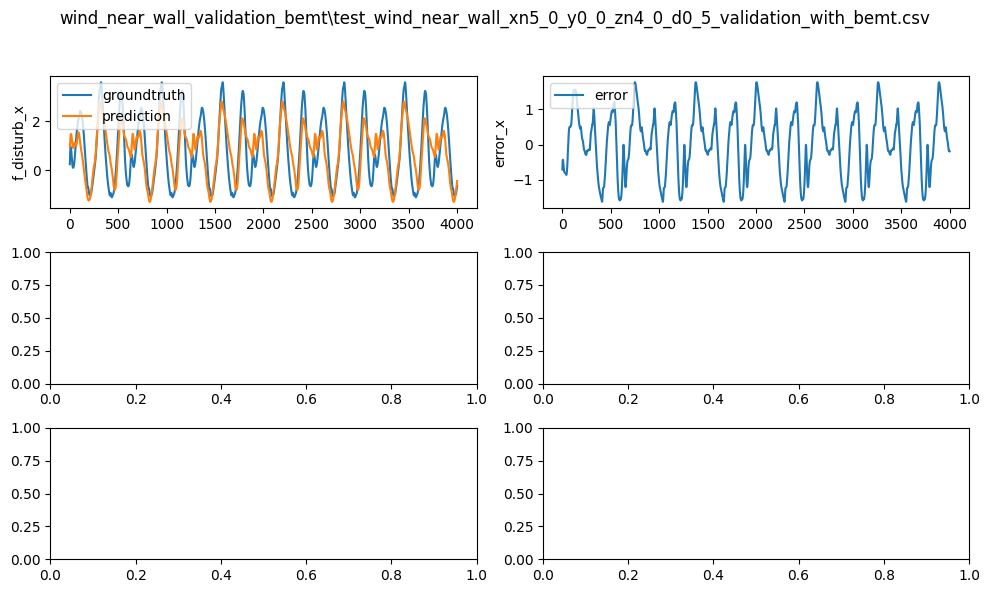

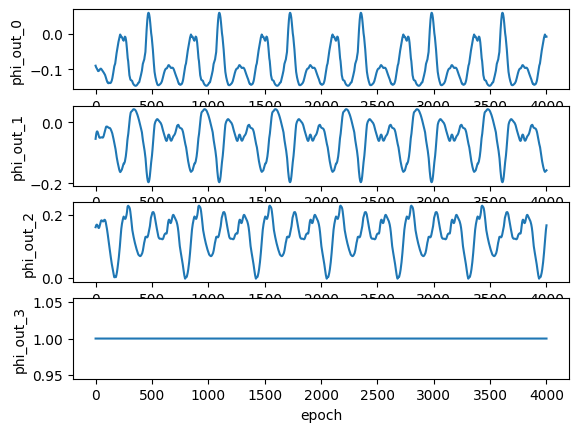

In [6]:
%matplotlib inline
current_dir = os.getcwd()
subfolder = "wind_near_wall_validation_bemt"
# subfolder = "wind_near_wall_validation_no_bemt"
# subfolder = "wind_near_wall_bemt_in_control_train_xz_wind"
# subfolder = "nf_validation_back2back"
folder_path = os.path.join(os.path.dirname(current_dir), "data", "training", subfolder)
file_names = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

# Filter out files that do not end with .csv
file_names = [f for f in file_names if f.endswith('.csv')]
# add subfolder to the file names
data_list = [os.path.join(subfolder, f) for f in file_names]
for data in data_list:
    print(data)

# debug
# data_list = data_list[:1]  # use small data list for quick testing

phi, h = training_manager.load_model(model_name)
# make a new trainer to replicate the above setup, just to allow verify_model to work
manager.validate(phi, h, data_list)
plt.show()  
